In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir("/content/drive/MyDrive/dsma-crisismmd/")
!pwd

/content/drive/MyDrive/dsma-crisismmd


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import random
from PIL import Image


In [ ]:
data = pd.read_csv("./all_combined_data.csv")


###Basic EDA

In [ ]:
print(data.info())

print(data.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1689 entries, 0 to 1688
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   tweet_id              1589 non-null   float64
 1   image_id              1589 non-null   object 
 2   text_info             1689 non-null   object 
 3   image_info            1689 non-null   object 
 4   tweet_text            1689 non-null   object 
 5   image_path            1689 non-null   object 
 6   processed_tweet_text  1689 non-null   object 
 7   label                 1689 non-null   object 
 8   manual_label          1689 non-null   object 
 9   data_type             1689 non-null   object 
dtypes: float64(1), object(9)
memory usage: 132.1+ KB
None
tweet_id                100
image_id                100
text_info                 0
image_info                0
tweet_text                0
image_path                0
processed_tweet_text      0
label                     

In [ ]:
print(data.shape)

(1689, 10)


### Display data examples

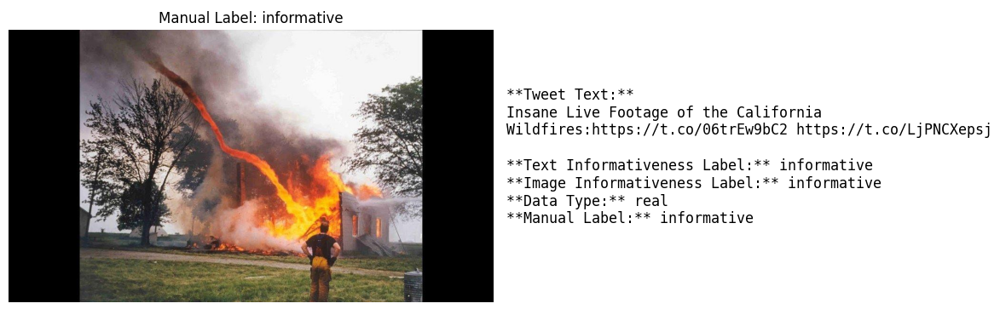

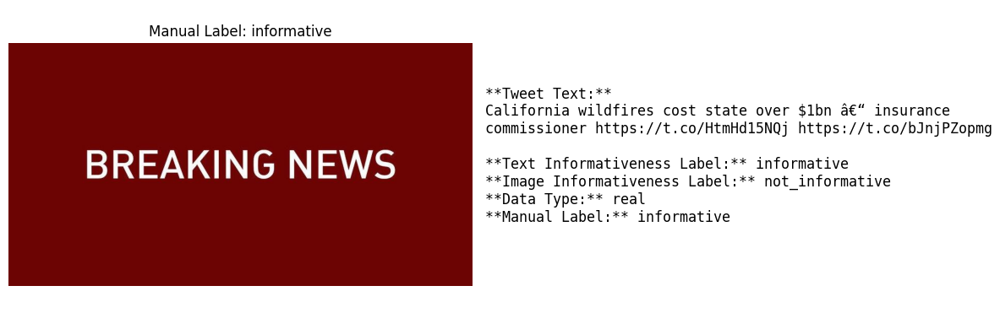

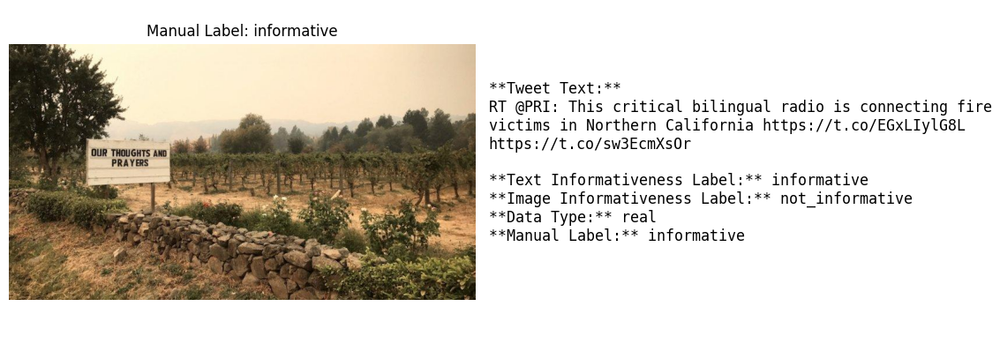

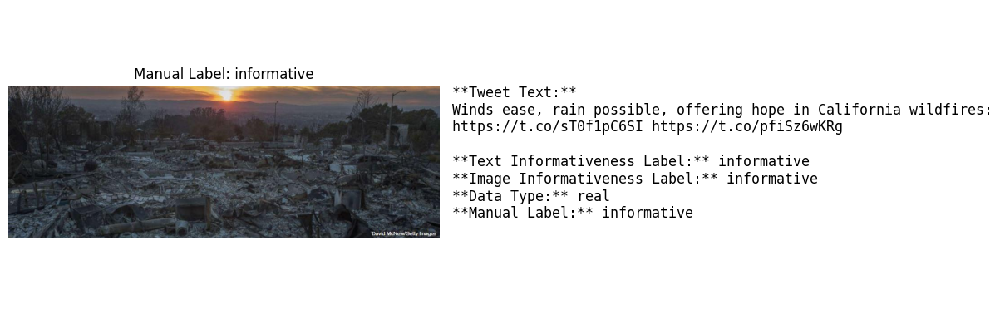

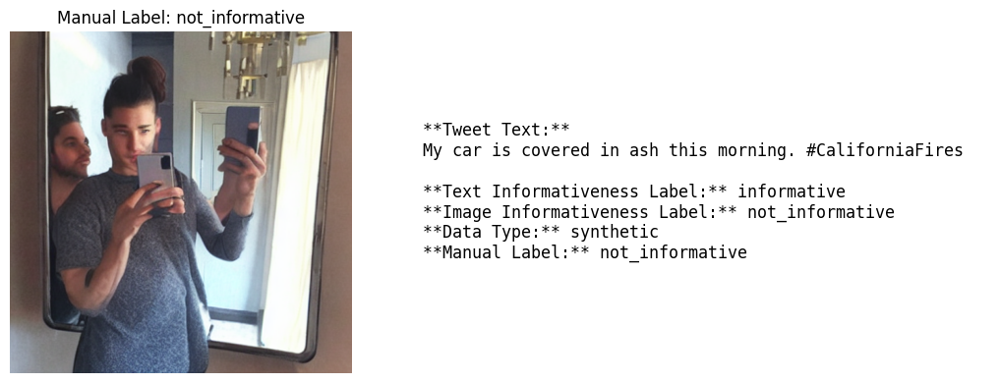

In [ ]:
# Function to display a few examples
def display_examples(data, num_examples=5, image_dir=""):
    # Randomly sample a few rows from the dataset
    samples = data.sample(n=num_examples)

    for _, row in samples.iterrows():
        text = row["tweet_text"]
        text_label = row["text_info"]
        image_label = row["image_info"]
        image_path = row["image_path"]
        manual_label = row["manual_label"]
        data_type = row["data_type"]

        # Check if image exists
        if os.path.exists(image_path):
            image = Image.open(image_path)
        else:
            image = None

        # Create the plot
        plt.figure(figsize=(12, 4))

        # Display the image on the left
        if image:
            plt.subplot(1, 2, 1)
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"Manual Label: {manual_label}")
        else:
            plt.subplot(1, 2, 1)
            plt.text(0.5, 0.5, "Image not found", fontsize=12, ha='center', va='center')
            plt.axis("off")

        # Display the text on the right
        plt.subplot(1, 2, 2)
        text_display = (
            f"**Tweet Text:**\n{text}\n\n"
            f"**Text Informativeness Label:** {text_label}\n"
            f"**Image Informativeness Label:** {image_label}\n"
            f"**Data Type:** {data_type}\n"
            f"**Manual Label:** {manual_label}\n"
        )
        plt.text(0, 0.5, text_display, fontsize=12, wrap=True, verticalalignment="center", family="monospace")
        plt.axis("off")

        # Adjust spacing and show the plot
        plt.tight_layout()
        plt.show()


display_examples(data, num_examples=5)


### Text EDA


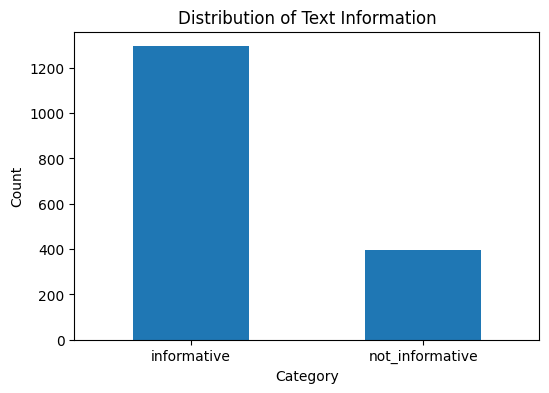

In [ ]:
import matplotlib.pyplot as plt

# Count the occurrences of 'informative' vs. 'not informative'
text_info_counts = data["text_info"].value_counts()

# Plot the distribution
plt.figure(figsize=(6, 4))
text_info_counts.plot(kind='bar')
plt.title("Distribution of Text Information")
plt.xlabel("Category")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.show()


### Image EDA

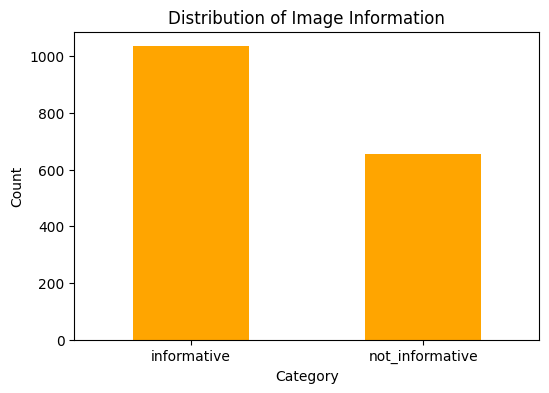

In [ ]:
# Count occurrences of 'informative' vs. 'not informative' in image_info
image_info_counts = data["image_info"].value_counts()

# Plot the distribution
plt.figure(figsize=(6, 4))
image_info_counts.plot(kind='bar', color='orange')
plt.title("Distribution of Image Information")
plt.xlabel("Category")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.show()


### Correlation Between Text and Image informativeness



image_info       informative  not_informative
text_info                                    
informative              923              372
not_informative          112              282


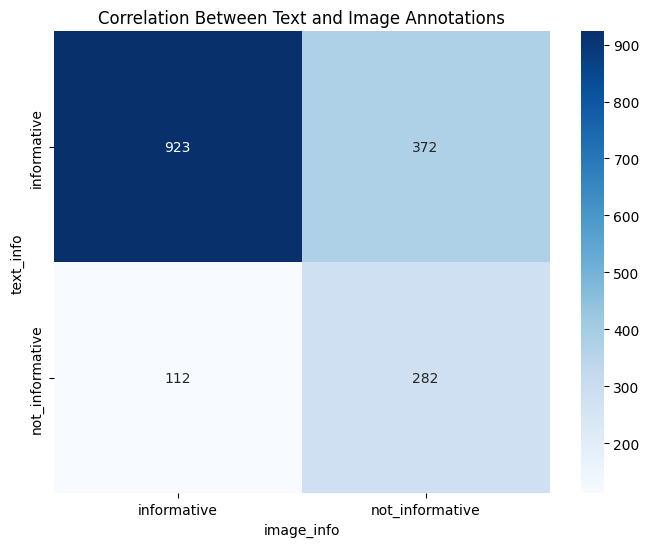

In [ ]:
info_correlation = pd.crosstab(data["text_info"], data["image_info"])
print(info_correlation)

# Heatmap for better visualization
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(info_correlation, annot=True, cmap="Blues", fmt="d")
plt.title("Correlation Between Text and Image Annotations")
plt.show()

### Finding the overall informativeness
- Both mode informative -> Informative
- One informative, one uninformative -> Ambiguous
- Both mode uninformative -> Uninformative


In [ ]:
def assign_label(row):
    if row['text_info'] == 'informative' and row['image_info'] == 'informative':
        return 'informative'
    elif (row['text_info'] == 'informative' and row['image_info'] != 'informative') or \
         (row['text_info'] != 'informative' and row['image_info'] == 'informative'):
        return 'ambiguous'
    else:
        return 'not_informative'


In [ ]:
data['auto_label'] = data.apply(assign_label, axis=1)

In [ ]:
data.tail()

,tweet_id,image_id,text_info,image_info,tweet_text,image_path,processed_tweet_text,label,manual_label,data_type,auto_label
1684,NaN,NaN,not_informative,informative,OMG… the fires just keep getting worse 😭,ambiguous_images/correct_info_image_45.png,omg… the fires just keep getting worse 😭,Ambiguous,not_informative,synthetic,ambiguous
1685,NaN,NaN,not_informative,informative,Can’t believe what I’m seeing on the news…,ambiguous_images/correct_info_image_46.png,can’t believe what i’m seeing on the news…,Ambiguous,not_informative,synthetic,ambiguous
1686,NaN,NaN,not_informative,informative,The sky is orange here… unreal.,ambiguous_images/correct_info_image_47.png,the sky is orange here… unreal.,Ambiguous,not_informative,synthetic,ambiguous
1687,NaN,NaN,not_informative,informative,Stay safe everyone 😥 #wildfires,ambiguous_images/correct_info_image_48.png,stay safe everyone 😥 #wildfires,Ambiguous,not_informative,synthetic,ambiguous
1688,NaN,NaN,not_informative,informative,Can’t believe what I’m seeing on the news…,ambiguous_images/correct_info_image_49.png,can’t believe what i’m seeing on the news…,Ambiguous,not_informative,synthetic,ambiguous


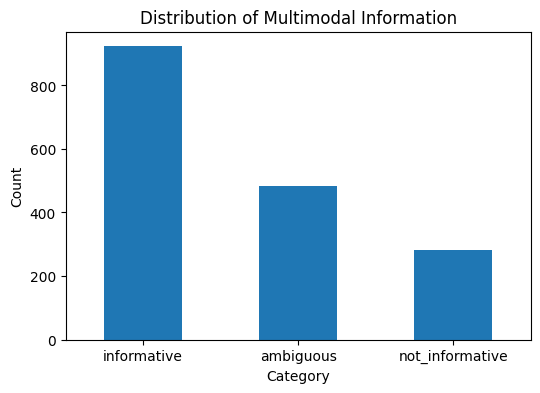

In [ ]:
ambi_info_counts = data["auto_label"].value_counts()

# Plot the distribution
plt.figure(figsize=(6, 4))
ambi_info_counts.plot(kind='bar')
plt.title("Distribution of Multimodal Information")
plt.xlabel("Category")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.show()

In [ ]:
ambi_info_counts

,count
auto_label,
informative,923
ambiguous,484
not_informative,282


In [ ]:
df = data.copy()

### Load annotated data

image_info       informative  not_informative
manual_label                                 
informative              984              319
not_informative           51              335


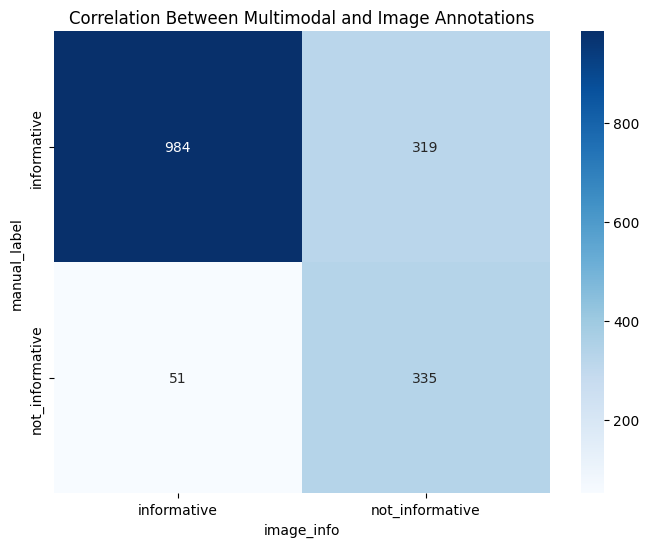

In [ ]:
img_info_correlation = pd.crosstab(df["manual_label"], df["image_info"])
print(img_info_correlation)

# Heatmap for better visualization
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(img_info_correlation, annot=True, cmap="Blues", fmt="d")
plt.title("Correlation Between Multimodal and Image Annotations")
plt.show()

text_info        informative  not_informative
manual_label                                 
informative             1242               61
not_informative           53              333


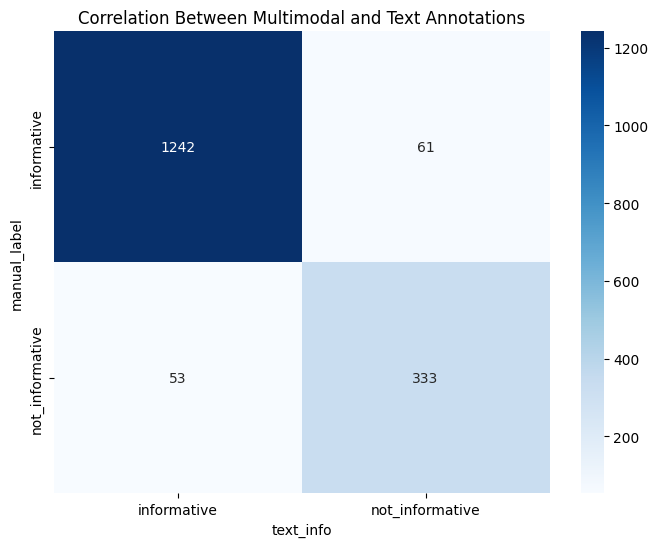

In [ ]:
text_info_correlation = pd.crosstab(df["manual_label"], df["text_info"])
print(text_info_correlation)

# Heatmap for better visualization
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.heatmap(text_info_correlation, annot=True, cmap="Blues", fmt="d")
plt.title("Correlation Between Multimodal and Text Annotations")
plt.show()

In [ ]:
df[df['label']=="Ambiguous"]["manual_label"].value_counts()

,count
manual_label,
informative,380
not_informative,104


### Model


#### Prep data

In [ ]:

df['is_ambiguous'] = (df['auto_label'] == 'ambiguous').astype(int)
print(df[['auto_label', 'is_ambiguous']].head())


    auto_label  is_ambiguous
0  informative             0
1  informative             0
2  informative             0
3    ambiguous             1
4  informative             0


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split


train_data, test_data = train_test_split(
    df,
    test_size=0.2,  # 20% test split
    stratify=df['is_ambiguous'],  # Stratify based on the ambiguity flag
    random_state=42
)

print("Proportion of Ambiguous Data in Training Set:", train_data['is_ambiguous'].mean())
print("Proportion of Ambiguous Data in Testing Set:", test_data['is_ambiguous'].mean())
print("Train:", train_data.shape)
print("Test:", test_data.shape)


Proportion of Ambiguous Data in Training Set: 0.28645447816432273
Proportion of Ambiguous Data in Testing Set: 0.2869822485207101
Train: (1351, 12)
Test: (338, 12)


In [ ]:
test_data[test_data['label']=="Ambiguous"]["manual_label"].value_counts()

,count
manual_label,
informative,77
not_informative,20


#### Unimodal Text


In [ ]:
from transformers import BertTokenizer
from sklearn.preprocessing import LabelEncoder

# Initialize BERT tokenizer
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Tokenize the text data
train_encodings = tokenizer(list(train_data['processed_tweet_text']), truncation=True, padding=True, max_length=128, return_tensors="pt")
test_encodings = tokenizer(list(test_data['processed_tweet_text']), truncation=True, padding=True, max_length=128, return_tensors="pt")

# Encode the labels
label_encoder = LabelEncoder()
train_labels = label_encoder.fit_transform(train_data['manual_label'])
test_labels = label_encoder.transform(test_data['manual_label'])

print("Label mapping:", dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_))))


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

Label mapping: {'informative': np.int64(0), 'not_informative': np.int64(1)}


In [ ]:
import torch

class TextDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = torch.tensor(self.labels[idx])
        return item

# Create datasets
train_dataset = TextDataset(train_encodings, train_labels)
test_dataset = TextDataset(test_encodings, test_labels)


In [ ]:
from transformers import BertForSequenceClassification, Trainer, TrainingArguments

# Load pre-trained BERT model for classification
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=len(label_encoder.classes_))

# Define training arguments
training_args = TrainingArguments(
    output_dir="./results",          # Directory to save model checkpoints
    eval_strategy="epoch",    # Evaluate at the end of each epoch
    save_strategy="epoch",          # Save model at the end of each epoch
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=10,
    weight_decay=0.01,
    logging_dir="./logs",           # Directory to save logs
    logging_steps=10,
    save_total_limit=2,
    report_to="none"
)

# Set up the Trainer
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
trainer.train()


Epoch,Training Loss,Validation Loss
1,0.102800,1.100054
2,0.043600,1.141814
3,0.101300,1.128998
4,0.044800,1.094640
5,0.001100,1.129992
6,0.073800,1.137281
7,0.021900,1.129179
8,0.005600,1.144784
9,0.002800,1.145613
10,0.003600,1.136984


TrainOutput(global_step=850, training_loss=0.024712565826142535, metrics={'train_runtime': 273.0102, 'train_samples_per_second': 49.485, 'train_steps_per_second': 3.113, 'total_flos': 305476046383200.0, 'train_loss': 0.024712565826142535, 'epoch': 10.0})

In [ ]:
from sklearn.metrics import classification_report

# Get predictions
predictions = trainer.predict(test_dataset)
y_pred = predictions.predictions.argmax(axis=1)

# Decode labels back to original text format
y_true = label_encoder.inverse_transform(test_labels)
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# Print classification report
print(classification_report(y_true, y_pred_decoded))


                 precision    recall  f1-score   support

    informative       0.87      0.92      0.89       265
not_informative       0.62      0.49      0.55        73

       accuracy                           0.83       338
      macro avg       0.74      0.71      0.72       338
   weighted avg       0.81      0.83      0.82       338



In [ ]:
ambiguous_indices = test_data[(test_data['label'] == 'Ambiguous')].index

# Filter true and predicted labels for ambiguous cases
ambiguous_true = [y_true[i] for i in range(len(y_true)) if test_data.iloc[i].name in ambiguous_indices]
ambiguous_pred = [y_pred_decoded[i] for i in range(len(y_pred_decoded)) if test_data.iloc[i].name in ambiguous_indices]

# Generate classification report for ambiguous cases
print("Classification Report for Ambiguous Cases (Text Model):")
print(classification_report(ambiguous_true, ambiguous_pred))

Classification Report for Ambiguous Cases (Text Model):
                 precision    recall  f1-score   support

    informative       0.97      0.83      0.90        77
not_informative       0.58      0.90      0.71        20

       accuracy                           0.85        97
      macro avg       0.78      0.87      0.80        97
   weighted avg       0.89      0.85      0.86        97



In [ ]:
ambiguous_indices = test_data[(test_data['label'] == 'Ambiguous') & (test_data["data_type"] == "real")].index

# Filter true and predicted labels for ambiguous cases
ambiguous_true = [y_true[i] for i in range(len(y_true)) if test_data.iloc[i].name in ambiguous_indices]
ambiguous_pred = [y_pred_decoded[i] for i in range(len(y_pred_decoded)) if test_data.iloc[i].name in ambiguous_indices]

# Generate classification report for ambiguous cases
print("Classification Report for Ambiguous Cases (Text Model):")
print(classification_report(ambiguous_true, ambiguous_pred))

Classification Report for Ambiguous Cases (Text Model):
                 precision    recall  f1-score   support

    informative       0.97      0.83      0.90        77
not_informative       0.07      0.33      0.12         3

       accuracy                           0.81        80
      macro avg       0.52      0.58      0.51        80
   weighted avg       0.94      0.81      0.87        80



#### Unimodal Image


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report
from PIL import Image
import pandas as pd
from tqdm import tqdm
import numpy as np
device = "cuda"


# ------------------------------

# Define transforms
train_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Custom Dataset Class
class CustomDataset(Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image = Image.open(row['image_path']).convert("RGB")
        label = row['manual_label']
        if self.transform:
            image = self.transform(image)
        return image, label

# Create datasets
train_dataset = CustomDataset(train_data, transform=train_transforms)
test_dataset = CustomDataset(test_data, transform=val_transforms)

# Compute class weights
classes = np.unique(train_data['manual_label'])
class_weights = compute_class_weight('balanced', classes=classes, y=train_data['manual_label'])
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)

# Map labels to integers for PyTorch
label_mapping = {label: idx for idx, label in enumerate(classes)}
train_data['mapped_label'] = train_data['manual_label'].map(label_mapping)
test_data['mapped_label'] = test_data['manual_label'].map(label_mapping)

# # Weighted sampler for balanced batches
# sample_weights = train_data['manual_label'].map({cls: class_weights[idx] for idx, cls in enumerate(classes)}).values
# sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32,num_workers=2)# sampler=sampler, num_workers=2)
val_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=2)

# ------------------------------
# 2. Model Preparation
# ------------------------------
# Load pre-trained VGG16 model
vgg16 = models.vgg16(pretrained=True)

# Freeze early layers
for param in vgg16.features.parameters():
    param.requires_grad = False

# Replace classifier
vgg16.classifier = nn.Sequential(
    nn.Linear(vgg16.classifier[0].in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, len(classes))  # Number of classes
)

vgg16.to(device)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()  # NO class weights in loss function
optimizer = optim.Adam(vgg16.parameters(), lr=1e-4, weight_decay=1e-4)

# ------------------------------
# 3. Training and Validation Loops
# ------------------------------
def train_model(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in tqdm(dataloader):
        images = images.to(device)
        labels = torch.tensor([label_mapping[l] for l in labels]).to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
        running_loss += loss.item()

    return running_loss / len(dataloader), correct / total


def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images = images.to(device)
            labels = torch.tensor([label_mapping[l] for l in labels]).to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            running_loss += loss.item()

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / len(dataloader), correct / total, all_preds, all_labels


# ------------------------------
# 4. Training with Early Stopping
# ------------------------------
num_epochs = 25
best_val_loss = float('inf')
patience = 5
early_stopping_counter = 0

for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")

    # Training phase
    train_loss, train_acc = train_model(vgg16, train_loader, criterion, optimizer, device)

    # Validation phase
    val_loss, val_acc, val_preds, val_labels = evaluate_model(vgg16, val_loader, criterion, device)

    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stopping_counter = 0
        torch.save(vgg16.state_dict(), "best_vgg16_model.pth")
        print("Saved best model.")
    else:
        early_stopping_counter += 1
        if early_stopping_counter >= patience:
            print("Early stopping triggered.")
            break

# ------------------------------
# 5. Generate Classification Report
# ------------------------------
# Decode predictions and labels
decoded_preds = [classes[p] for p in val_preds]
decoded_labels = [classes[l] for l in val_labels]

print("Classification Report:")
print(classification_report(decoded_labels, decoded_preds))


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/25


100%|██████████| 43/43 [00:20<00:00,  2.06it/s]


Train Loss: 0.5126, Train Acc: 0.7520
Val Loss: 0.4382, Val Acc: 0.7959
Saved best model.
Epoch 2/25


100%|██████████| 43/43 [00:18<00:00,  2.34it/s]


Train Loss: 0.3405, Train Acc: 0.8386
Val Loss: 0.4602, Val Acc: 0.7929
Epoch 3/25


100%|██████████| 43/43 [00:18<00:00,  2.35it/s]


Train Loss: 0.2852, Train Acc: 0.8764
Val Loss: 0.4707, Val Acc: 0.7899
Epoch 4/25


100%|██████████| 43/43 [00:19<00:00,  2.20it/s]


Train Loss: 0.2559, Train Acc: 0.8853
Val Loss: 0.4921, Val Acc: 0.7899
Epoch 5/25


100%|██████████| 43/43 [00:18<00:00,  2.32it/s]


Train Loss: 0.2124, Train Acc: 0.9141
Val Loss: 0.5139, Val Acc: 0.7959
Epoch 6/25


100%|██████████| 43/43 [00:18<00:00,  2.36it/s]


Train Loss: 0.1795, Train Acc: 0.9312
Val Loss: 0.5757, Val Acc: 0.7929
Early stopping triggered.
Classification Report:
                 precision    recall  f1-score   support

    informative       0.84      0.91      0.87       265
not_informative       0.53      0.38      0.44        73

       accuracy                           0.79       338
      macro avg       0.69      0.64      0.66       338
   weighted avg       0.77      0.79      0.78       338



In [ ]:
from sklearn.metrics import classification_report

ambiguous_cases = test_data[test_data['label'] == 'Ambiguous']

ambiguous_indices = ambiguous_cases.index
ambiguous_true = [val_labels[i] for i in range(len(val_labels)) if test_data.iloc[i].name in ambiguous_indices]
ambiguous_pred = [val_preds[i] for i in range(len(val_preds)) if test_data.iloc[i].name in ambiguous_indices]

# Decode labels if they are integers
decoded_true = [classes[label] for label in ambiguous_true]
decoded_pred = [classes[label] for label in ambiguous_pred]

print("Classification Report for Ambiguous Cases:")
print(classification_report(decoded_true, decoded_pred))


Classification Report for Ambiguous Cases:
                 precision    recall  f1-score   support

    informative       0.85      0.83      0.84        77
not_informative       0.41      0.45      0.43        20

       accuracy                           0.75        97
      macro avg       0.63      0.64      0.64        97
   weighted avg       0.76      0.75      0.76        97



In [ ]:
ambiguous_indices = test_data[(test_data['label'] == 'Ambiguous') & (test_data["data_type"] == "real")].index
ambiguous_true = [val_labels[i] for i in range(len(val_labels)) if test_data.iloc[i].name in ambiguous_indices]
ambiguous_pred = [val_preds[i] for i in range(len(val_preds)) if test_data.iloc[i].name in ambiguous_indices]

# Decode labels if they are integers
decoded_true = [classes[label] for label in ambiguous_true]
decoded_pred = [classes[label] for label in ambiguous_pred]

print("Classification Report for Ambiguous Cases:")
print(classification_report(decoded_true, decoded_pred))

Classification Report for Ambiguous Cases:
                 precision    recall  f1-score   support

    informative       0.97      0.83      0.90        77
not_informative       0.07      0.33      0.12         3

       accuracy                           0.81        80
      macro avg       0.52      0.58      0.51        80
   weighted avg       0.94      0.81      0.87        80



#### Multimodal

In [ ]:
from sklearn.utils import resample
from sklearn.preprocessing import LabelEncoder

# Encode labels
label_encoder = LabelEncoder()
train_data['encoded_label'] = label_encoder.fit_transform(train_data['manual_label'])
test_data['encoded_label'] = label_encoder.transform(test_data['manual_label'])


# Separate majority and minority classes
majority_class = train_data[train_data['encoded_label'] == 0]
minority_class = train_data[train_data['encoded_label'] == 1]

# Oversample the minority class
minority_oversampled = resample(minority_class,
                                replace=True,
                                n_samples=len(majority_class),
                                random_state=42)

train_data_balanced = pd.concat([majority_class, minority_oversampled]).sample(frac=1)


In [ ]:
train_data_balanced['manual_label'].value_counts()

,count
manual_label,
not_informative,1038
informative,1038


In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import torch
from transformers import BertTokenizer

# Image transformations
image_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Tokenizer for BERT
tokenizer = BertTokenizer.from_pretrained("bert-base-uncased")

# Dataset class
class MultimodalDataset(Dataset):
    def __init__(self, dataframe, image_transform=None):
        self.dataframe = dataframe
        self.image_transform = image_transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]

        # Process text
        text = row['processed_tweet_text']
        text_inputs = tokenizer(
            text,
            padding="max_length",
            truncation=True,
            max_length=128,
            return_tensors="pt"
        )

        # Process image
        image = Image.open(row['image_path']).convert("RGB")
        if self.image_transform:
            image = self.image_transform(image)

        # Label
        label = torch.tensor(row['encoded_label'], dtype=torch.long)

        return {
            "text_inputs": {key: val.squeeze(0) for key, val in text_inputs.items()},
            "image": image,
            "label": label
        }

train_dataset = MultimodalDataset(train_data, image_transform=image_transforms)
test_dataset = MultimodalDataset(test_data, image_transform=image_transforms)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
from torchvision import models
from transformers import BertModel
import torch.nn as nn
import torch

class MultimodalModel(nn.Module):
    def __init__(self, num_classes):
        super(MultimodalModel, self).__init__()

        # Image Modality: VGG16
        self.image_model = models.vgg16(pretrained=True)
        self.image_model.classifier = nn.Sequential(
            nn.Linear(self.image_model.classifier[0].in_features, 1024),  # Reduce to 1024
            nn.ReLU(),
            nn.Dropout(0.3),  # Add dropout
            nn.LayerNorm(1024),  # Add layer normalization
        )

        # Text Modality: BERT
        self.text_model = BertModel.from_pretrained("bert-base-uncased")

        self.text_fc = nn.Sequential(
            nn.Linear(self.text_model.config.hidden_size, 1024),
            nn.ReLU(),
            nn.BatchNorm1d(1024),
            nn.Dropout(0.3),
        )


        # Cross-Attention for Fusion
        self.cross_attention = nn.MultiheadAttention(embed_dim=1024, num_heads=8)

        # Fusion Layers
        self.fusion_fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes),
        )


    def forward(self, text_inputs, image_inputs):
        # Process text
        text_output = self.text_model(
            input_ids=text_inputs['input_ids'],
            attention_mask=text_inputs['attention_mask']
        )
        text_features = self.text_fc(text_output.pooler_output)  # BERT outputs a pooled vector

        # Process image
        image_features = self.image_model(image_inputs)

        # Cross-Attention Fusion
        # Reshape for attention: (batch_size, seq_len, embed_dim)
        text_features = text_features.unsqueeze(1)  # Add sequence dimension
        image_features = image_features.unsqueeze(1)  # Add sequence dimension
        fused_features, _ = self.cross_attention(
            query=text_features, key=image_features, value=image_features
        )
        fused_features = fused_features.squeeze(1)  # Remove sequence dimension

        # Combine text and image features
        combined_features = torch.cat((text_features.squeeze(1), fused_features), dim=1)

        # Final classification
        output = self.fusion_fc(combined_features)
        return output


In [ ]:
from tqdm import tqdm

def train_model(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for batch in tqdm(dataloader):
        text_inputs = {key: val.to(device) for key, val in batch['text_inputs'].items()}
        images = batch['image'].to(device)
        labels = batch['label'].to(device)

        optimizer.zero_grad()
        outputs = model(text_inputs, images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)
        running_loss += loss.item()

    return running_loss / len(dataloader), correct / total


def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in dataloader:
            text_inputs = {key: val.to(device) for key, val in batch['text_inputs'].items()}
            images = batch['image'].to(device)
            labels = batch['label'].to(device)

            outputs = model(text_inputs, images)
            loss = criterion(outputs, labels)

            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            running_loss += loss.item()

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return running_loss / len(dataloader), correct / total, all_preds, all_labels


In [ ]:
num_classes = len(label_encoder.classes_)  # Number of classes
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize model, criterion, optimizer
model = MultimodalModel(num_classes)
bestmodel = MultimodalModel(num_classes)

model.to(device)
bestmodel.to(device)
# criterion = nn.CrossEntropyLoss(weight=class_weights)
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=0.001)

# Training loop with early stopping
best_val_loss = 1000000
patience = 2
early_stopping_counter = 0
num_epochs = 20

for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    train_loss, train_acc = train_model(model, train_loader, criterion, optimizer, device)
    val_loss, val_acc, val_preds, val_labels = evaluate_model(model, test_loader, criterion, device)

    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        early_stopping_counter = 0
        bestmodel.load_state_dict(model.state_dict())
        torch.save(model.state_dict(), "best_multimodal_model.pth")
        print("Saved best model.")
    else:
        early_stopping_counter += 1
        if early_stopping_counter >= patience:
            print("Early stopping triggered.")
            break


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20


100%|██████████| 85/85 [00:53<00:00,  1.60it/s]


Train Loss: 0.5137, Train Acc: 0.7824
Val Loss: 0.5004, Val Acc: 0.8107
Saved best model.
Epoch 2/20


100%|██████████| 85/85 [00:52<00:00,  1.61it/s]


Train Loss: 0.3904, Train Acc: 0.8416
Val Loss: 0.5173, Val Acc: 0.7604
Epoch 3/20


100%|██████████| 85/85 [00:51<00:00,  1.64it/s]


Train Loss: 0.2780, Train Acc: 0.8956
Val Loss: 0.7952, Val Acc: 0.8225
Early stopping triggered.


In [ ]:
# model2 = MultimodalModel(num_classes=num_classes).to(device)

# model2.load_state_dict(torch.load("best_multimodal_model.pth"))

# Set the model to evaluation mode
bestmodel.eval()

val_loss, val_acc, val_preds, val_labels = evaluate_model(bestmodel, test_loader, criterion, device)


In [ ]:
from sklearn.metrics import classification_report

decoded_preds = label_encoder.inverse_transform(val_preds)
decoded_labels = label_encoder.inverse_transform(val_labels)

# Print classification report for the entire test set
print("Classification Report for Entire Test Set:")
print(classification_report(decoded_labels, decoded_preds))


Classification Report for Entire Test Set:
                 precision    recall  f1-score   support

    informative       0.83      0.96      0.89       265
not_informative       0.66      0.26      0.37        73

       accuracy                           0.81       338
      macro avg       0.74      0.61      0.63       338
   weighted avg       0.79      0.81      0.78       338



In [ ]:
real_indices = test_data[test_data['data_type'] == 'real'].index
real_true = [val_labels[i] for i, idx in enumerate(test_data.index) if idx in real_indices]
real_pred = [val_preds[i] for i, idx in enumerate(test_data.index) if idx in real_indices]

real_true_decoded = label_encoder.inverse_transform(real_true)
real_pred_decoded = label_encoder.inverse_transform(real_pred)

print("Classification Report for Real Data:")
print(classification_report(real_true_decoded, real_pred_decoded))

Classification Report for Real Data:
                 precision    recall  f1-score   support

    informative       0.83      0.96      0.89       265
not_informative       0.29      0.07      0.11        56

       accuracy                           0.81       321
      macro avg       0.56      0.52      0.50       321
   weighted avg       0.74      0.81      0.76       321



In [ ]:
ambiguous_indices = test_data[test_data['label'] == 'Ambiguous'].index

# Extract true and predicted labels for ambiguous data
ambiguous_true = [val_labels[i] for i, idx in enumerate(test_data.index) if idx in ambiguous_indices]
ambiguous_pred = [val_preds[i] for i, idx in enumerate(test_data.index) if idx in ambiguous_indices]

# Decode ambiguous labels
ambiguous_true_decoded = label_encoder.inverse_transform(ambiguous_true)
ambiguous_pred_decoded = label_encoder.inverse_transform(ambiguous_pred)

# Print classification report for ambiguous data
print("Classification Report for Ambiguous Data:")
print(classification_report(ambiguous_true_decoded, ambiguous_pred_decoded))

Classification Report for Ambiguous Data:
                 precision    recall  f1-score   support

    informative       0.93      0.92      0.93        77
not_informative       0.71      0.75      0.73        20

       accuracy                           0.89        97
      macro avg       0.82      0.84      0.83        97
   weighted avg       0.89      0.89      0.89        97



In [ ]:
ambiguous_indices = test_data[(test_data['label'] == 'Ambiguous') & (test_data["data_type"] == "real")].index

ambiguous_true = [val_labels[i] for i in range(len(val_labels)) if test_data.iloc[i].name in ambiguous_indices]
ambiguous_pred = [val_preds[i] for i in range(len(val_preds)) if test_data.iloc[i].name in ambiguous_indices]

# Decode labels if they are integers
decoded_true = [classes[label] for label in ambiguous_true]
decoded_pred = [classes[label] for label in ambiguous_pred]

print("Classification Report for Ambiguous Cases:")
print(classification_report(decoded_true, decoded_pred))

Classification Report for Ambiguous Cases:
                 precision    recall  f1-score   support

    informative       0.96      0.92      0.94        77
not_informative       0.00      0.00      0.00         3

       accuracy                           0.89        80
      macro avg       0.48      0.46      0.47        80
   weighted avg       0.92      0.89      0.91        80



Found 64 incorrectly predicted images.
Displaying examples of incorrectly predicted images:


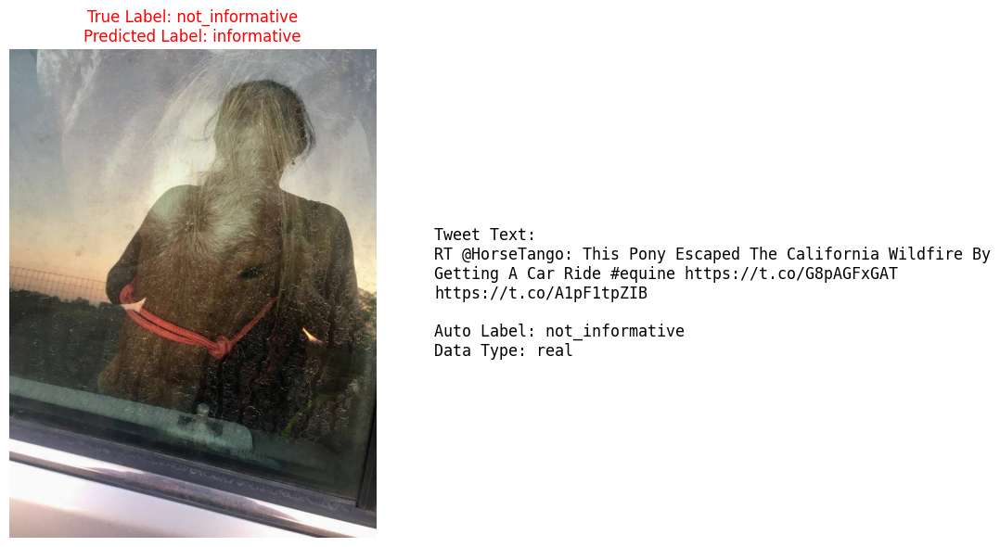

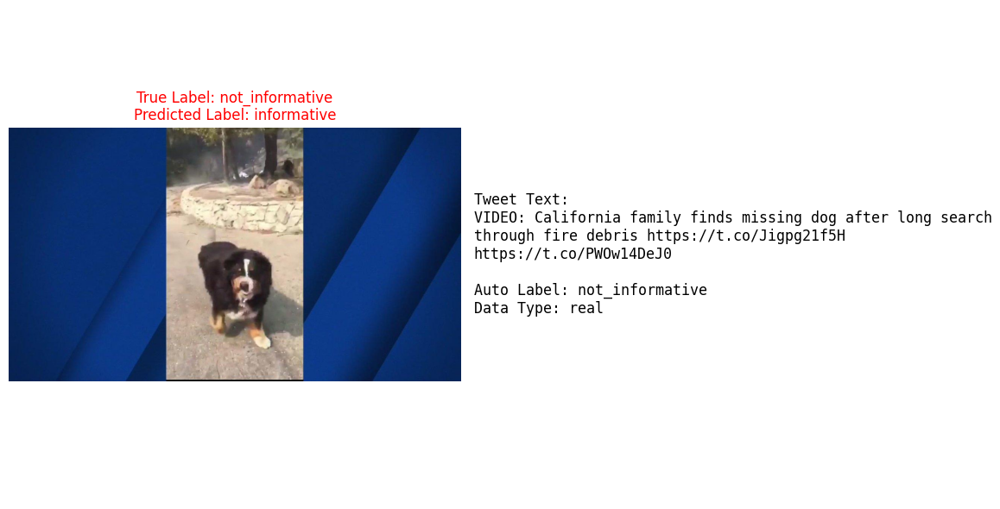

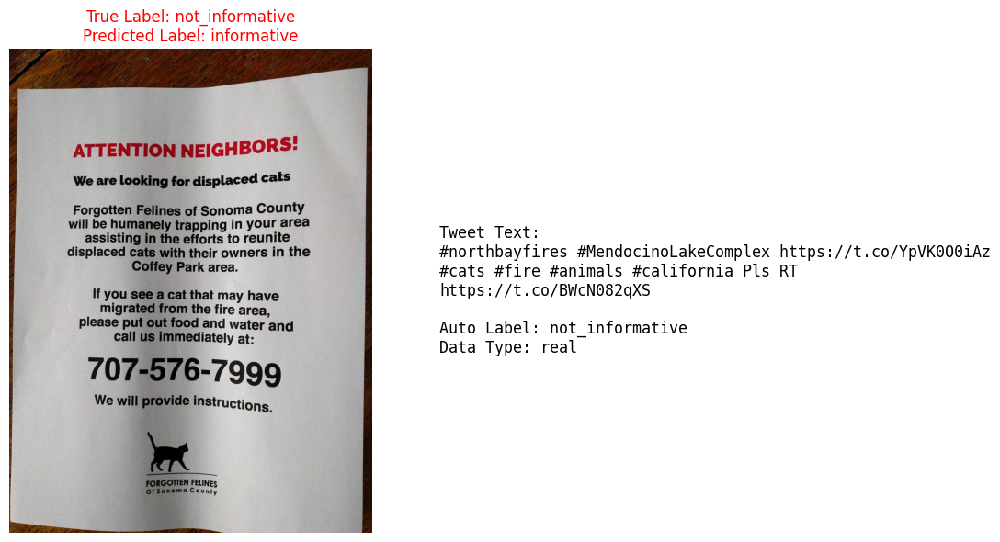

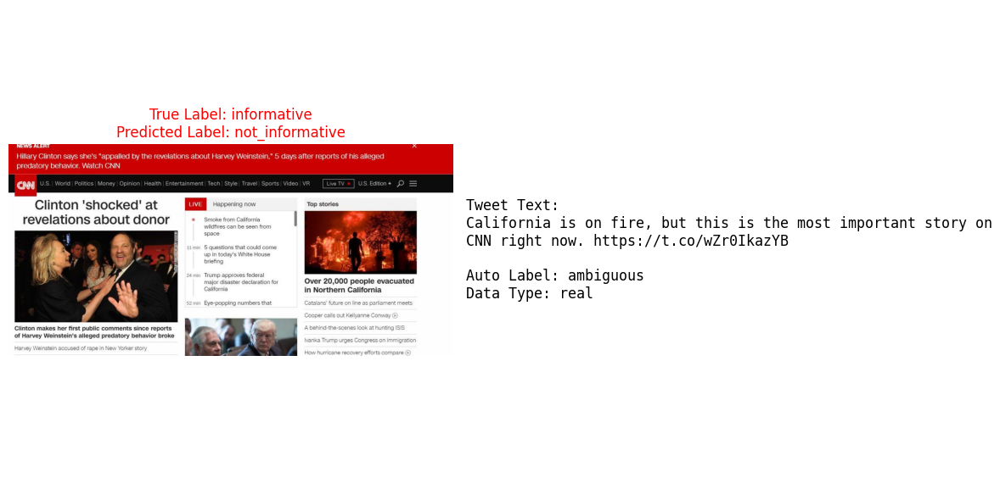

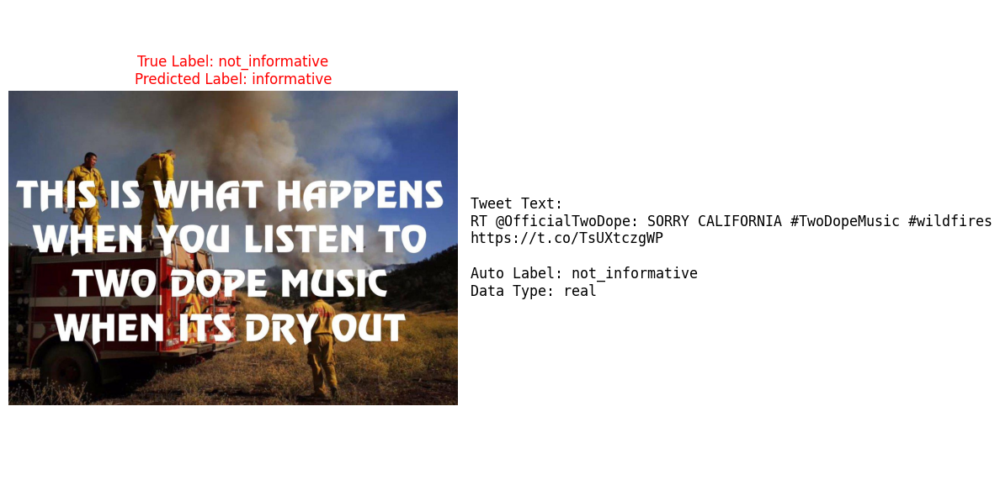

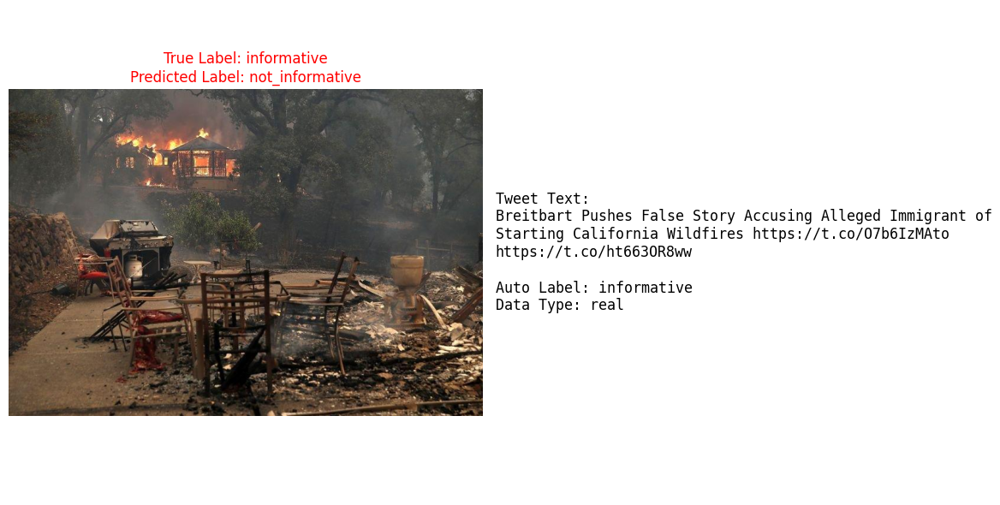

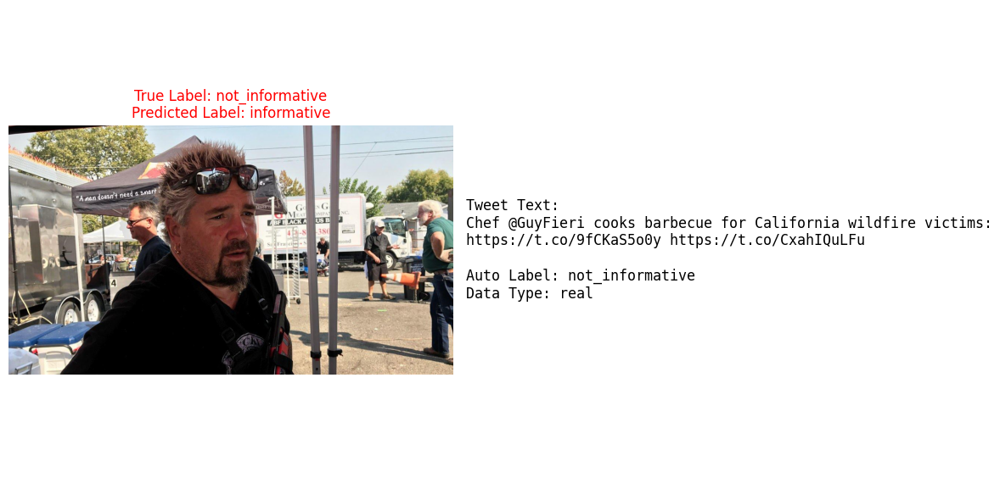

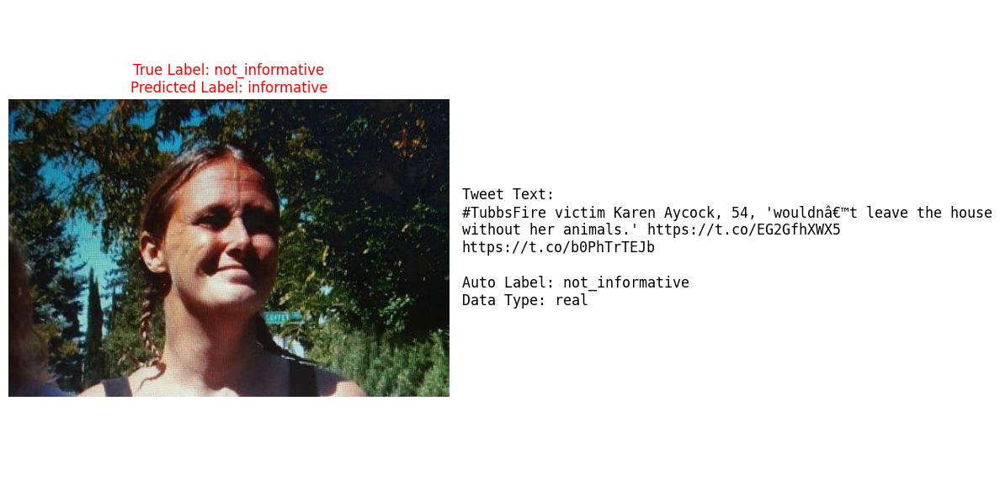

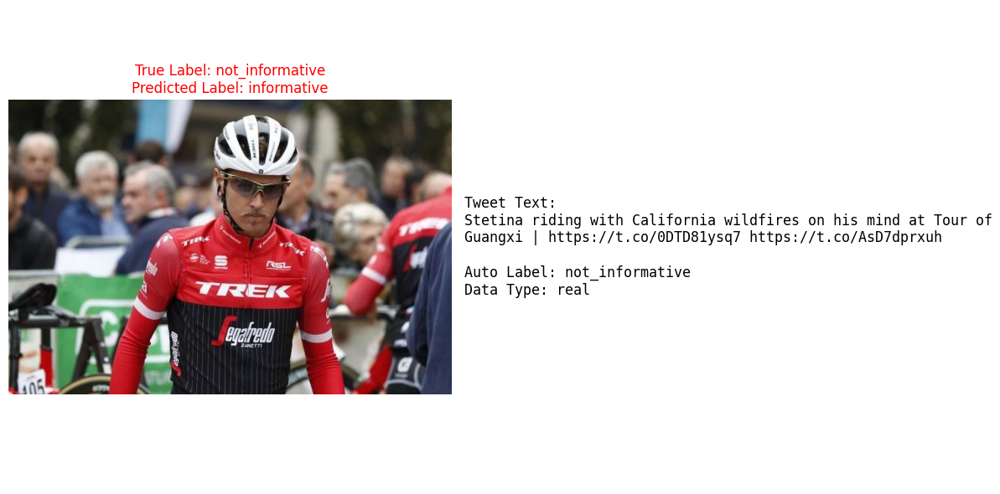

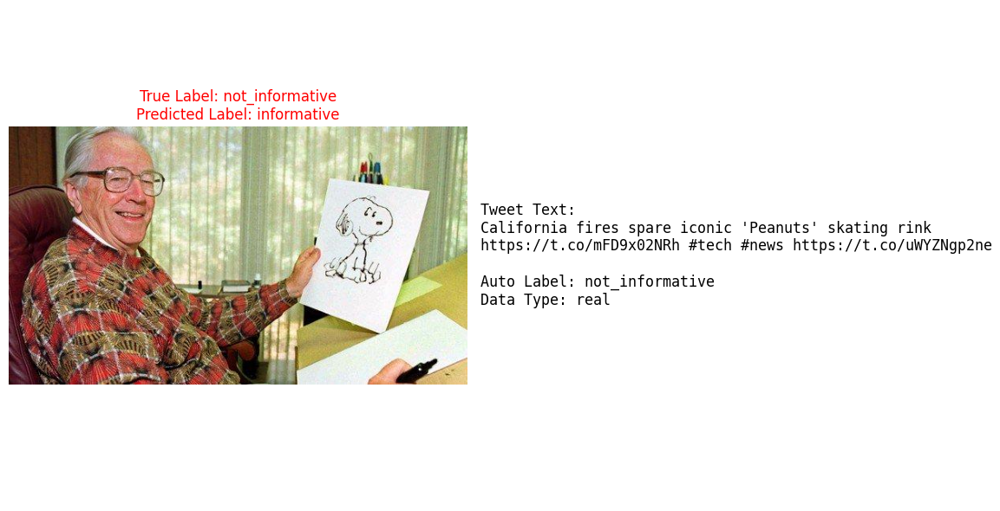

In [ ]:

# Find indices where predictions are wrong
wrong_indices = [i for i, (true, pred) in enumerate(zip(decoded_labels, decoded_preds)) if true != pred]

print(f"Found {len(wrong_indices)} incorrectly predicted images.")

# Display images of wrongly predicted data
print("Displaying examples of incorrectly predicted images:")

# Create a DataFrame of the test data with predictions and true labels
test_data_with_predictions = test_data.copy()
test_data_with_predictions['predicted_label'] = decoded_preds
test_data_with_predictions['true_label'] = decoded_labels


# Filter the DataFrame to only include incorrectly predicted rows
wrongly_predicted_df = test_data_with_predictions.iloc[wrong_indices]

# Function to display a few examples of wrong predictions
def display_wrong_examples(data, num_examples=5):
    # Randomly sample a few rows from the dataset of wrong predictions
    samples = data.sample(n=min(num_examples, len(data)))

    for _, row in samples.iterrows():
        text = row["tweet_text"]
        image_path = row["image_path"]
        true_label = row["true_label"]
        predicted_label = row["predicted_label"]
        auto_label = row["auto_label"]
        data_type = row["data_type"]


        # Check if image exists
        if os.path.exists(image_path):
            try:
                image = Image.open(image_path).convert("RGB")
            except Exception as e:
                print(f"Error opening image {image_path}: {e}")
                image = None
        else:
            image = None

        # Create the plot
        plt.figure(figsize=(12, 6))

        # Display the image on the left
        if image:
            plt.subplot(1, 2, 1)
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}", color='red')
        else:
            plt.subplot(1, 2, 1)
            plt.text(0.5, 0.5, "Image not found", fontsize=12, ha='center', va='center')
            plt.axis("off")
            plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}", color='red')


        # Display the text on the right
        plt.subplot(1, 2, 2)
        text_display = (
            f"Tweet Text:\n{text}\n\n"
            f"Auto Label: {auto_label}\n"
            f"Data Type: {data_type}"
        )
        plt.text(0, 0.5, text_display, fontsize=12, wrap=True, verticalalignment="center", family="monospace")
        plt.axis("off")

        # Adjust spacing and show the plot
        plt.tight_layout()
        plt.show()

# Call the function to display examples of wrongly predicted images
display_wrong_examples(wrongly_predicted_df, num_examples=10) # Display up to 10 examples

#### CLIP + Classifier

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import random
from PIL import Image

In [ ]:
!pip install transformers torchvision pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 35.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import torch

# Load the model and processor
device = "cuda" if torch.cuda.is_available() else "cpu"
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
def extract_clip_embeddings(df):
    text_embeds = []
    image_embeds = []
    valid_indices = []

    for idx, row in tqdm(df.iterrows(), total=len(df)):
        try:
            text = row['processed_tweet_text']
            img_path = row['image_path']

            image = Image.open(img_path).convert("RGB")
            inputs = processor(text=[text], images=image, return_tensors="pt", padding=True).to(device)

            with torch.no_grad():
                outputs = model(**inputs)
                img_feat = outputs.image_embeds.squeeze().cpu().numpy()
                txt_feat = outputs.text_embeds.squeeze().cpu().numpy()

            text_embeds.append(txt_feat)
            image_embeds.append(img_feat)
            valid_indices.append(idx)

        except Exception as e:
            print(f"Error on row {idx}: {e}")
            continue

    return np.array(text_embeds), np.array(image_embeds), valid_indices


In [ ]:
from tqdm import tqdm
import numpy as np

# Convert labels to binary
df['label_binary'] = df['manual_label'].str.lower().str.strip().map({
    "informative": 1,
    "not_informative": 0
})

# Get only valid rows (without errors during embedding)
text_embeds, image_embeds, valid_indices = extract_clip_embeddings(df)
df_valid = df.iloc[valid_indices].reset_index(drop=True)
labels = df_valid['label_binary'].values

100%|██████████| 1689/1689 [01:12<00:00, 23.34it/s]


In [ ]:
print(df_valid.shape, df.shape)

(1689, 13) (1689, 13)


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split


is_ambiguous_flags = df_valid['is_ambiguous'].values  # 0 or 1

# Early fusion of text and image embeddings
X = np.hstack([text_embeds, image_embeds])
y = labels

In [ ]:
# Train-test split stratified by ambiguity and label

stratify_labels = [f"{label}_{amb}" for label, amb in zip(y, is_ambiguous_flags)]

# Perform the split
X_train, X_test, y_train, y_test, train_idx, test_idx = train_test_split(
    X,
    y,
    range(len(y)),
    stratify=is_ambiguous_flags,
    test_size=0.2,
    random_state=42
)

In [ ]:
train_data = df_valid.iloc[train_idx].reset_index(drop=True)
test_data = df_valid.iloc[test_idx].reset_index(drop=True)

In [ ]:
# Print stats
print("Proportion of Ambiguous Data in Training Set:", train_data['is_ambiguous'].mean())
print("Proportion of Ambiguous Data in Testing Set:", test_data['is_ambiguous'].mean())
print("Train:", train_data.shape)
print("Test:", test_data.shape)

Proportion of Ambiguous Data in Training Set: 0.28645447816432273
Proportion of Ambiguous Data in Testing Set: 0.2869822485207101
Train: (1351, 13)
Test: (338, 13)


In [ ]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(max_iter=1000)

clf.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [ ]:
from sklearn.metrics import classification_report

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=["not informative", "informative"]))


                 precision    recall  f1-score   support

not informative       0.81      0.58      0.67        73
    informative       0.89      0.96      0.93       265

       accuracy                           0.88       338
      macro avg       0.85      0.77      0.80       338
   weighted avg       0.87      0.88      0.87       338



In [ ]:
results_df = pd.DataFrame({
    'true_label': y_test,
    'pred_label': y_pred,
}, index=test_data.index)

# Join with `test_data` to get 'is_ambiguous' flag
results_df = results_df.join(test_data[['is_ambiguous']])

# Filter only ambiguous data
ambiguous_results = results_df[results_df['is_ambiguous'] == True]

# Classification report for ambiguous data
print("📊 Classification Report for Ambiguous Tweets:")
print(classification_report(
    ambiguous_results['true_label'],
    ambiguous_results['pred_label'],
    target_names=["not informative", "informative"]
))

📊 Classification Report for Ambiguous Tweets:
                 precision    recall  f1-score   support

not informative       0.62      0.80      0.70        20
    informative       0.94      0.87      0.91        77

       accuracy                           0.86        97
      macro avg       0.78      0.84      0.80        97
   weighted avg       0.88      0.86      0.86        97



In [ ]:
results_df = pd.DataFrame({
    'true_label': y_test,
    'pred_label': y_pred,
}, index=test_data.index)

results_df = results_df.join(test_data[['is_ambiguous']])

results_df = results_df.join(test_data[['data_type']])

# Filter only ambiguous data
ambiguous_results = results_df[(results_df['is_ambiguous'] == True)&(results_df['data_type'] == "real")]

# Classification report for ambiguous data
print("📊 Classification Report for Ambiguous Tweets:")
print(classification_report(
    ambiguous_results['true_label'],
    ambiguous_results['pred_label'],
    target_names=["not informative", "informative"]
))

📊 Classification Report for Ambiguous Tweets:
                 precision    recall  f1-score   support

not informative       0.09      0.33      0.14         3
    informative       0.97      0.87      0.92        77

       accuracy                           0.85        80
      macro avg       0.53      0.60      0.53        80
   weighted avg       0.94      0.85      0.89        80



In [ ]:
results_df.tail()

,true_label,pred_label,is_ambiguous,data_type
333,1,0,1,real
334,1,1,0,real
335,1,1,0,real
336,1,1,0,real
337,1,1,0,real


In [ ]:
test_data

,tweet_id,image_id,text_info,image_info,tweet_text,image_path,processed_tweet_text,label,manual_label,data_type,auto_label,is_ambiguous,label_binary
0,9.199764e+17,919976381869539328_0,informative,informative,Raging California wildfires burned 80 cell tow...,data_image/california_wildfires/16_10_2017/919...,raging california wildfires burned 80 cell tow...,Informative,informative,real,informative,0,1
1,9.227405e+17,922740491187380224_0,informative,informative,Incredible drone footage of this California ne...,data_image/california_wildfires/24_10_2017/922...,incredible drone footage of this california ne...,Informative,informative,real,informative,0,1
2,9.177969e+17,917796883610820608_0,informative,informative,A quick rundown of what you need to know about...,data_image/california_wildfires/10_10_2017/917...,a quick rundown of what you need to know about...,Informative,informative,real,informative,0,1
3,9.203201e+17,920320104839237632_0,not_informative,not_informative,California woman stole from fire evacuees in S...,data_image/california_wildfires/17_10_2017/920...,california woman stole from fire evacuees in s...,Uninformative,not_informative,real,not_informative,0,0
4,9.213946e+17,921394649092280321_0,informative,not_informative,California wildfires: Watch as this family fin...,data_image/california_wildfires/20_10_2017/921...,california wildfires: watch as this family fin...,Ambiguous,informative,real,ambiguous,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
333,9.178229e+17,917822878124568577_0,informative,not_informative,I just had to evacuate my home in California d...,data_image/california_wildfires/10_10_2017/917...,i just had to evacuate my home in california d...,Ambiguous,informative,real,ambiguous,1,1
334,9.214381e+17,921438122021412866_0,informative,informative,"PSA: No, drug cartels didnâ€™t start the North...",data_image/california_wildfires/20_10_2017/921...,"psa: no, drug cartels didnâ€™t start the north...",Informative,informative,real,informative,0,1
335,9.221447e+17,922144749632479232_1,informative,informative,Residents recall the night they had to flee th...,data_image/california_wildfires/22_10_2017/922...,residents recall the night they had to flee th...,Informative,informative,real,informative,0,1
336,9.199090e+17,919909006508019712_0,informative,informative,Watch as two roommates make a dramatic escape ...,data_image/california_wildfires/16_10_2017/919...,watch as two roommates make a dramatic escape ...,Informative,informative,real,informative,0,1


Found 41 misclassified tweets.


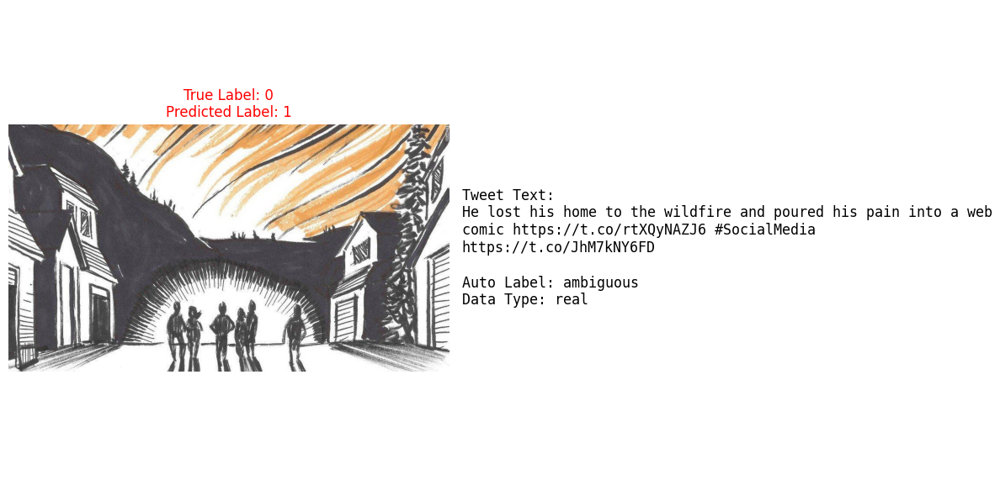

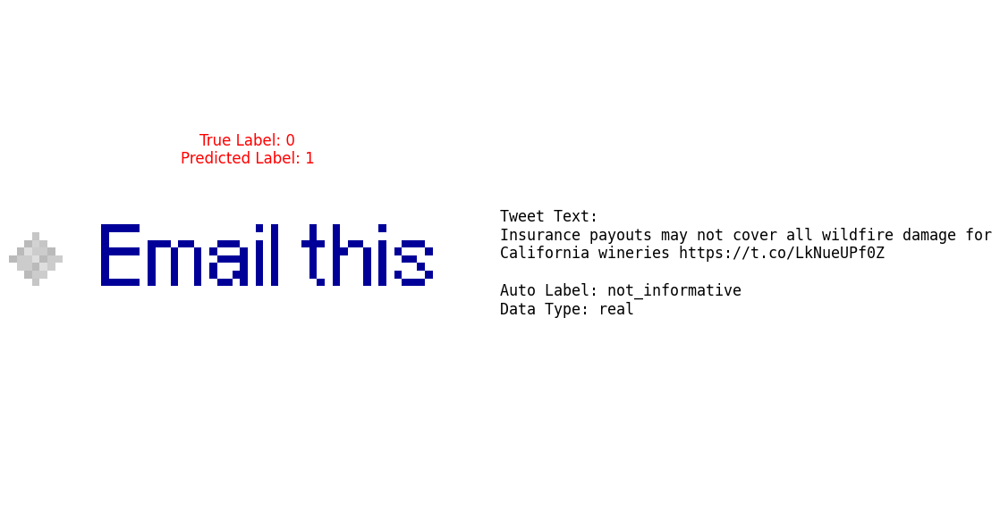

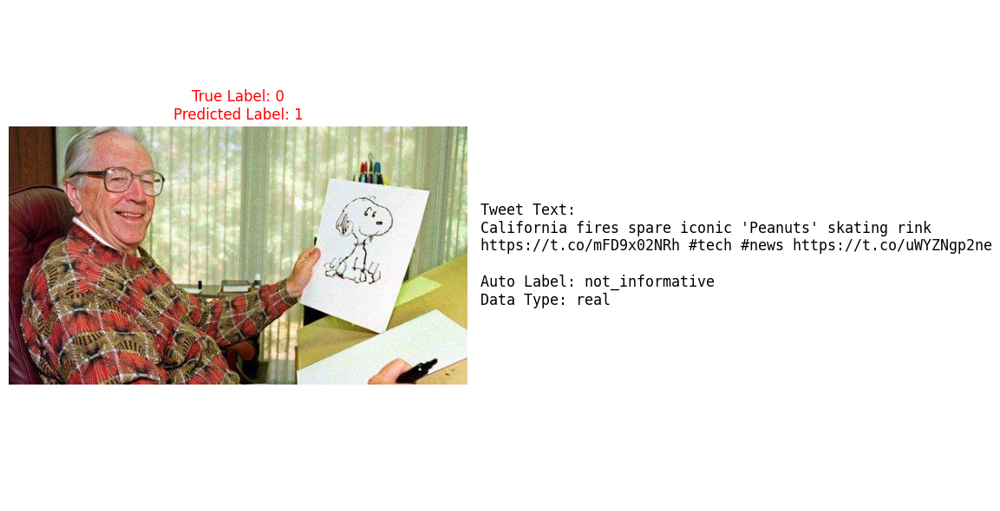

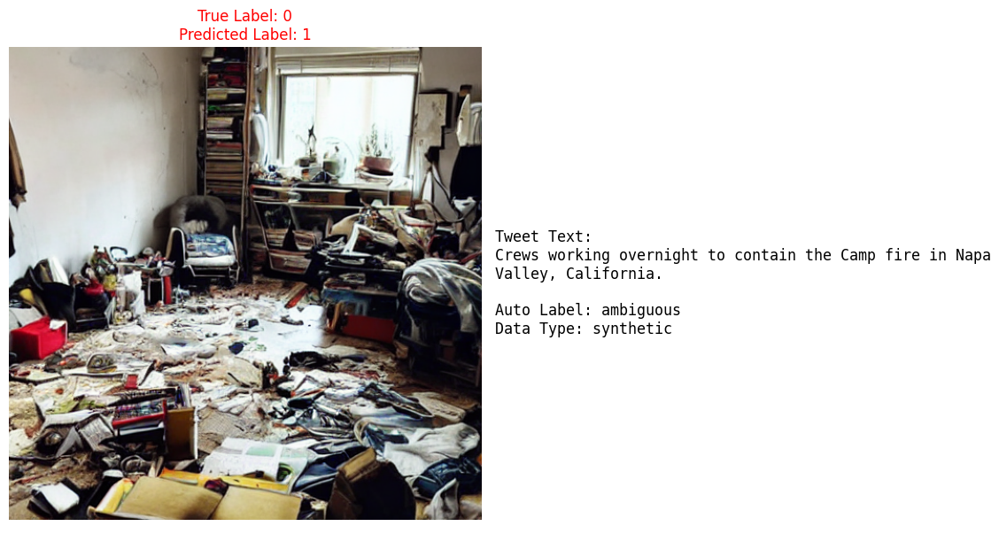

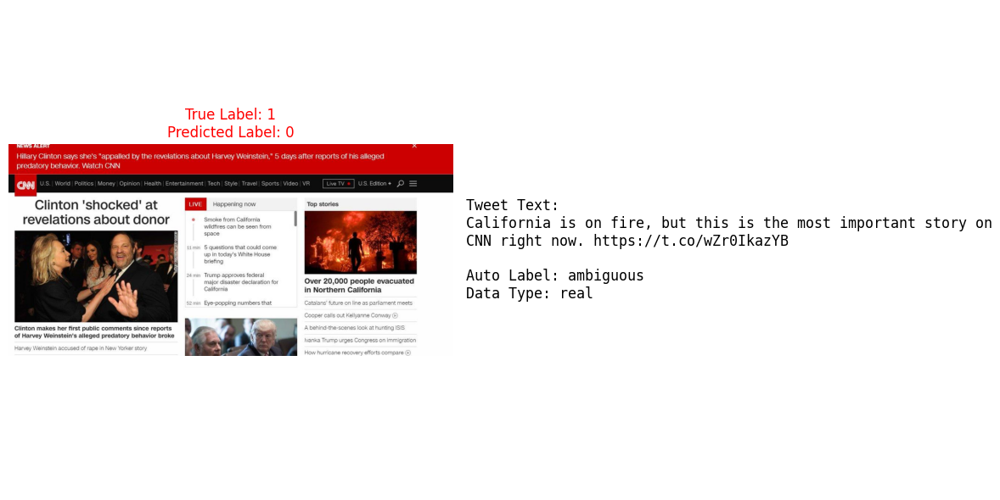

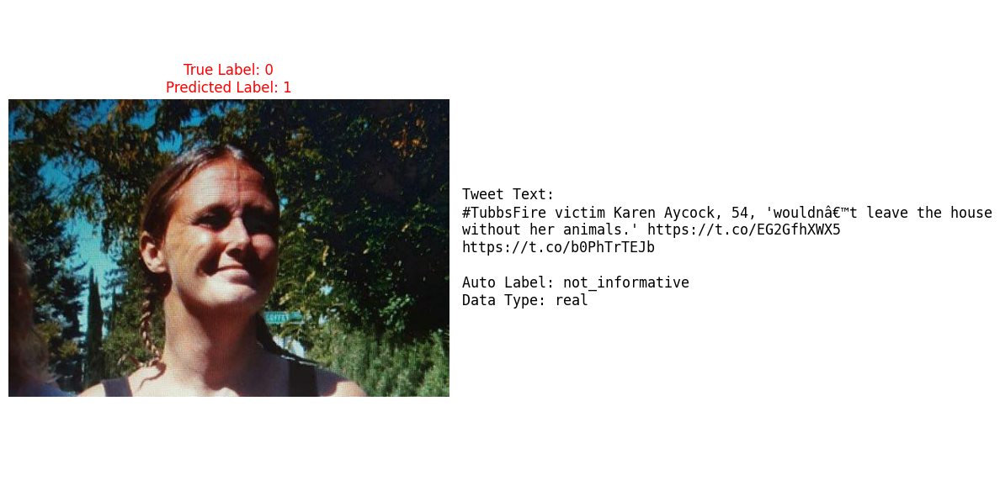

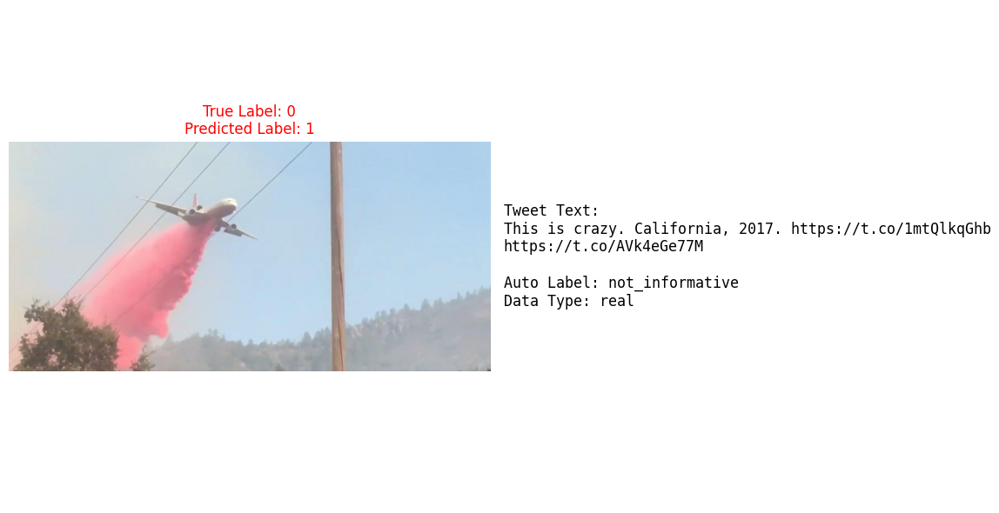

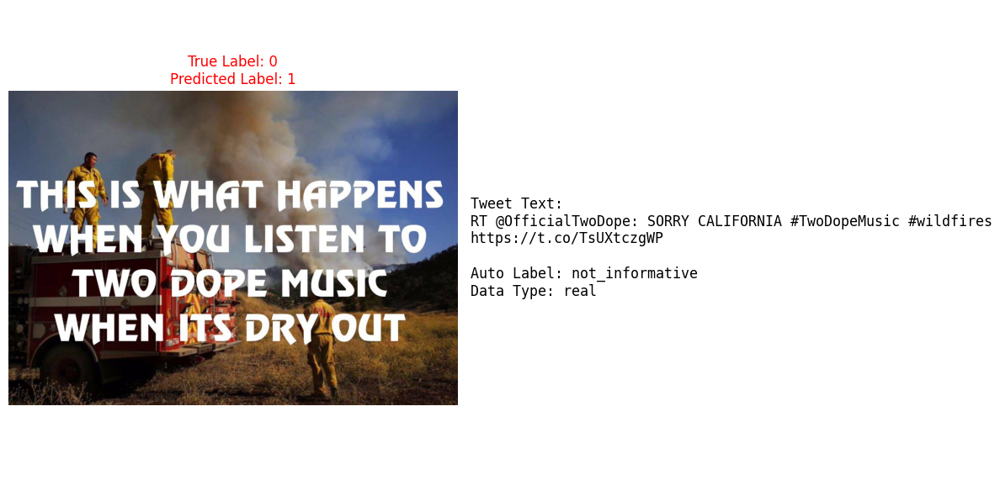

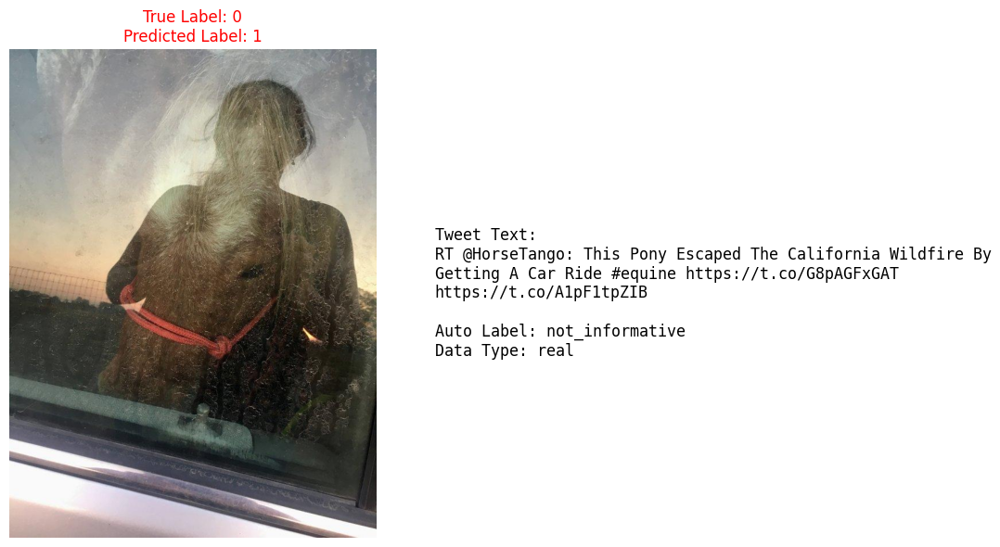

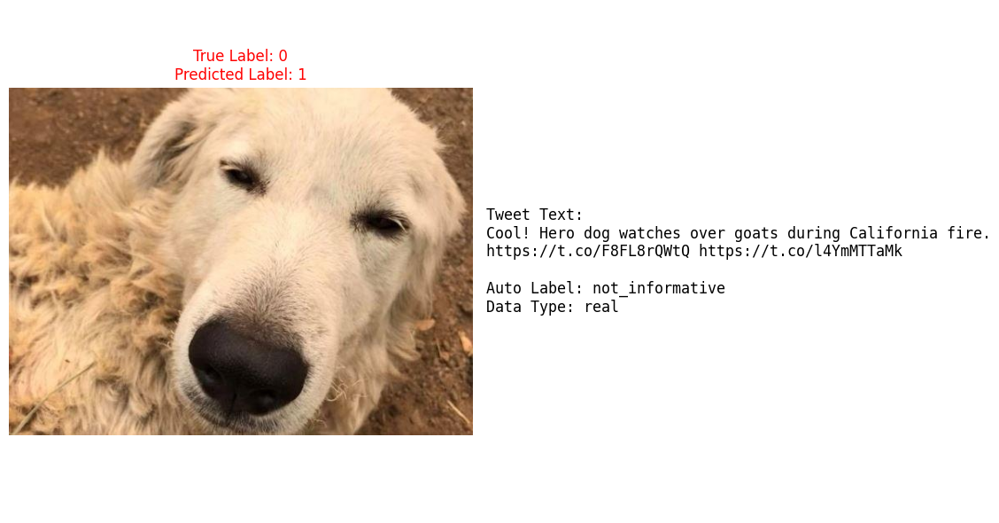

In [ ]:
# Filter the DataFrame to get misclassified tweets
misclassified_tweets = results_df[results_df['true_label'] != results_df['pred_label']]

print(f"Found {len(misclassified_tweets)} misclassified tweets.")

# Function to display a few examples of misclassified tweets
def display_misclassified_examples(data, num_examples=5):
    # Randomly sample a few rows from the DataFrame of misclassified tweets
    samples = data.sample(n=min(num_examples, len(data)))

    for _, row in samples.iterrows():
        text = row["tweet_text"]
        image_path = row["image_path"]
        true_label = row["true_label"]
        predicted_label = row["pred_label"]
        auto_label = row["auto_label"]
        data_type = row["data_type"]


        # Check if image exists
        if os.path.exists(image_path):
            try:
                image = Image.open(image_path).convert("RGB")
            except Exception as e:
                print(f"Error opening image {image_path}: {e}")
                image = None
        else:
            image = None

        # Create the plot
        plt.figure(figsize=(12, 6))

        # Display the image on the left
        if image:
            plt.subplot(1, 2, 1)
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}", color='red')
        else:
            plt.subplot(1, 2, 1)
            plt.text(0.5, 0.5, "Image not found", fontsize=12, ha='center', va='center')
            plt.axis("off")
            plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}", color='red')


        # Display the text on the right
        plt.subplot(1, 2, 2)
        text_display = (
            f"Tweet Text:\n{text}\n\n"
            f"Auto Label: {auto_label}\n"
            f"Data Type: {data_type}"
        )
        plt.text(0, 0.5, text_display, fontsize=12, wrap=True, verticalalignment="center", family="monospace")
        plt.axis("off")

        # Adjust spacing and show the plot
        plt.tight_layout()
        plt.show()

# Call the function to display examples of misclassified tweets
display_misclassified_examples(misclassified_tweets, num_examples=10) # Display up to 10 examples

In [ ]:
results_df = results_df.join(test_data[['image_path']])